<a href="https://colab.research.google.com/github/trashchenkov/LLM-First-Touch/blob/main/gemini.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Чтобы получить доступ к моделям от Google по API, заходим в [Google AI Studio](https://aistudio.google.com/), попадаем в веб-интерфейс, где можно экспериментировать с моделями. **Внимание!** **С российским IP не пустит!**

Слева есть кнопка "Get API key". Идем туда и получаем ключ, чтобы авторизовываться при обращении к API. Я полученный ключ храню в Секретах Google Colab.

In [1]:
from google.colab import userdata
key_g = userdata.get('GEMINI')

Для начала сделаем просто генерацию текстовых фрагментов и изображений, как это показано в [документации](https://developers.googleblog.com/en/experiment-with-gemini-20-flash-native-image-generation/).

In [2]:
from google import genai
from google.genai import types

client = genai.Client(api_key=key_g)

response = client.models.generate_content(
    model="gemini-2.0-flash-exp",
    contents=(
        "Создай трогательную и поучительную сказку о доброй и трудолюбивой пчеле."
        "Для каждой сцены сгенерируй изображение. Пусть изображения будут мультяшными."
    ),
    config=types.GenerateContentConfig(
        response_modalities=["Text", "Image"]
    ),
)

Установим библиотеки, которые понадобятся для формирования документа.

In [4]:
!pip install weasyprint

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 850.6/850.6 kB 23.4 MB/s eta 0:00:00


In [3]:
!pip install markdown2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 2.4 MB/s eta 0:00:00


Из полученного от модели ответа (в виде фрагментов текста и картинок) сформируем HTML и выведем на экран.


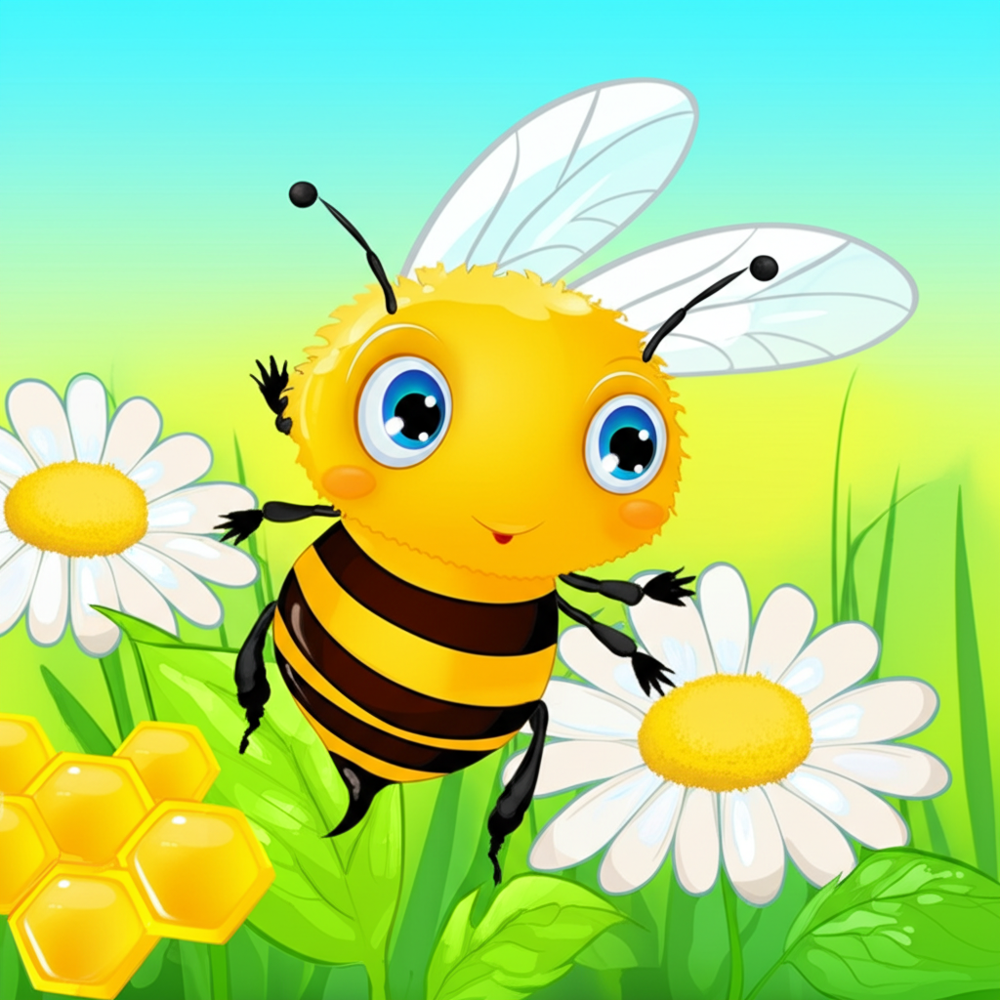
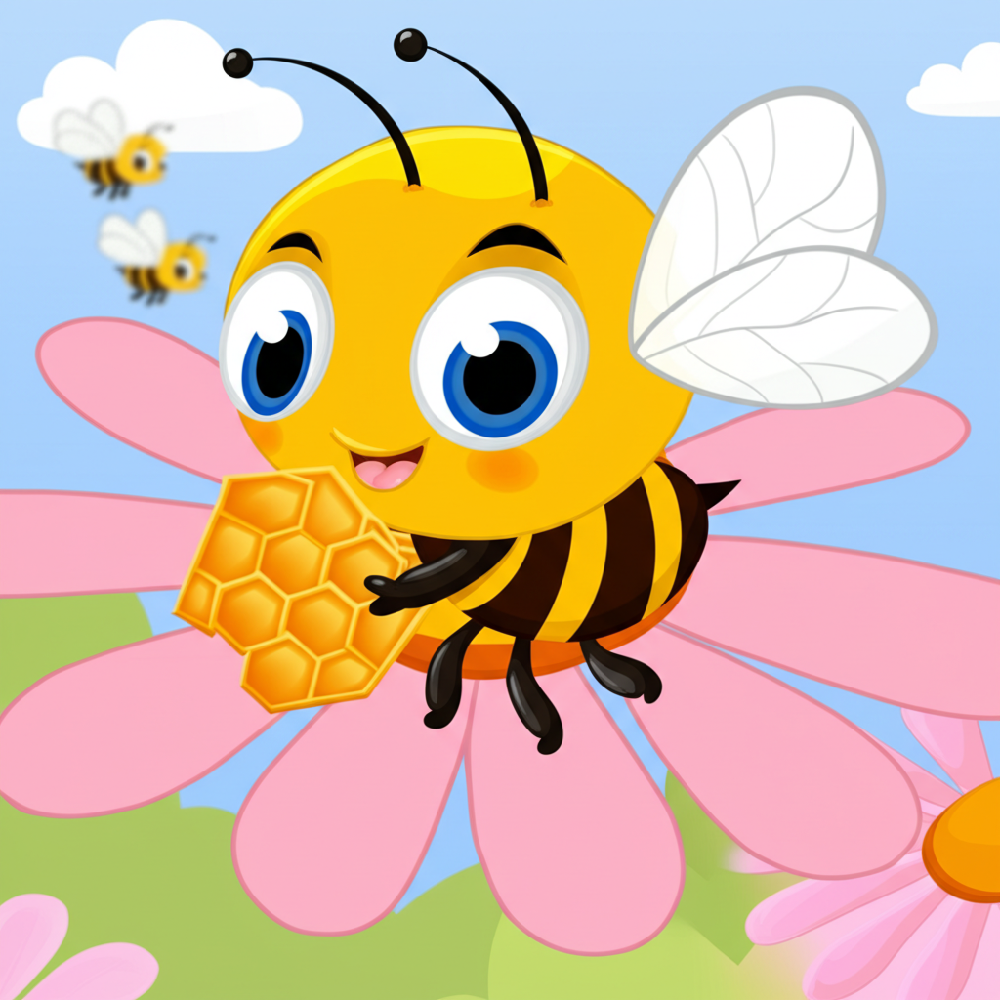
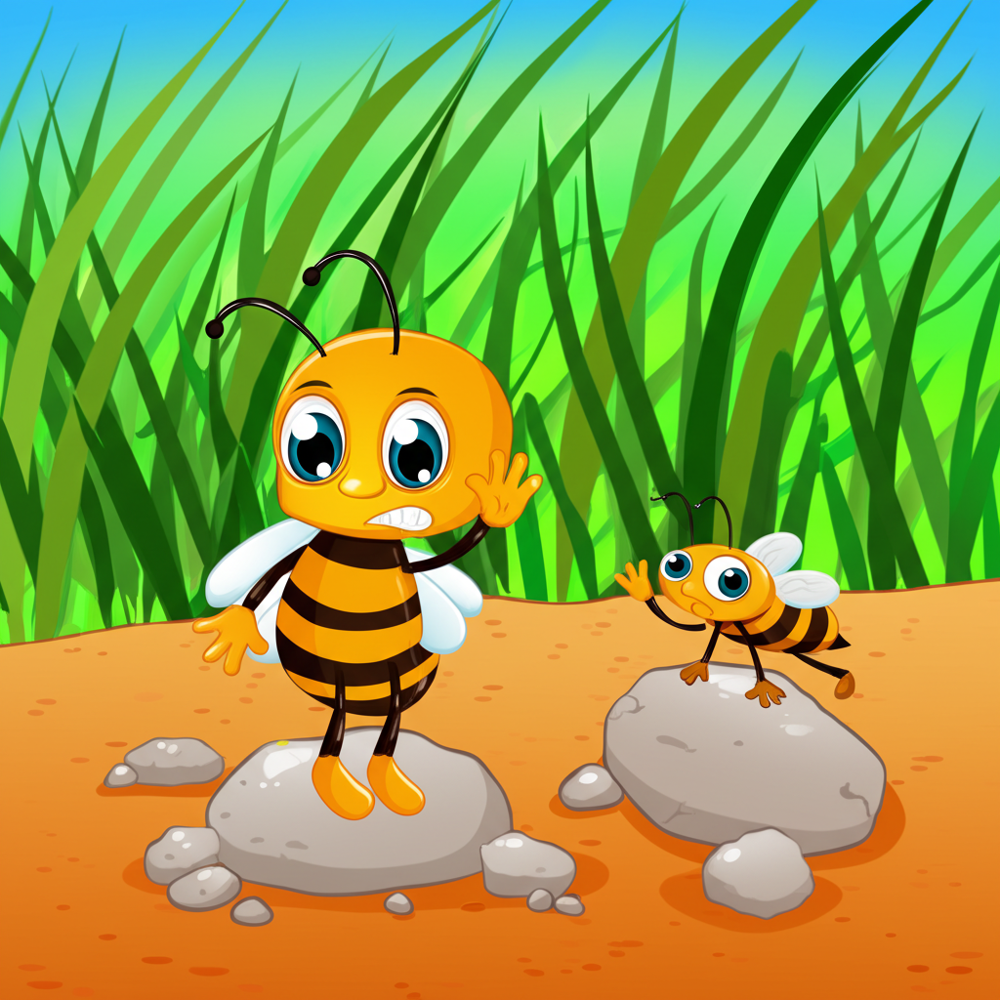
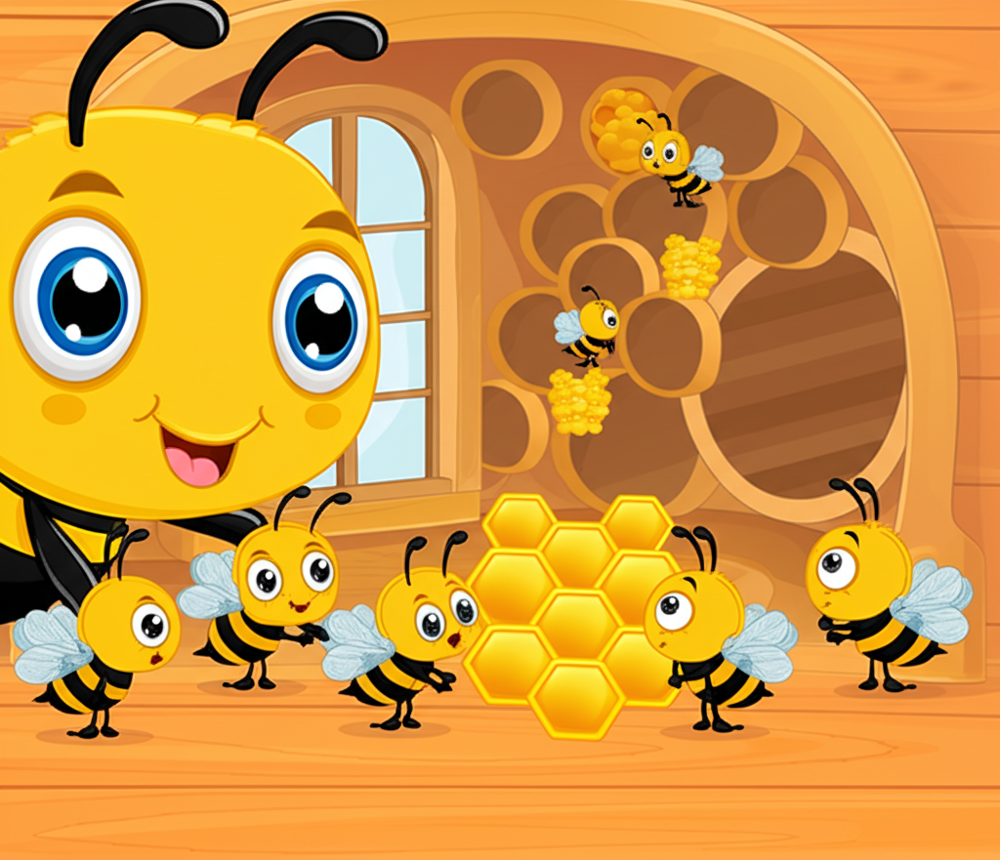
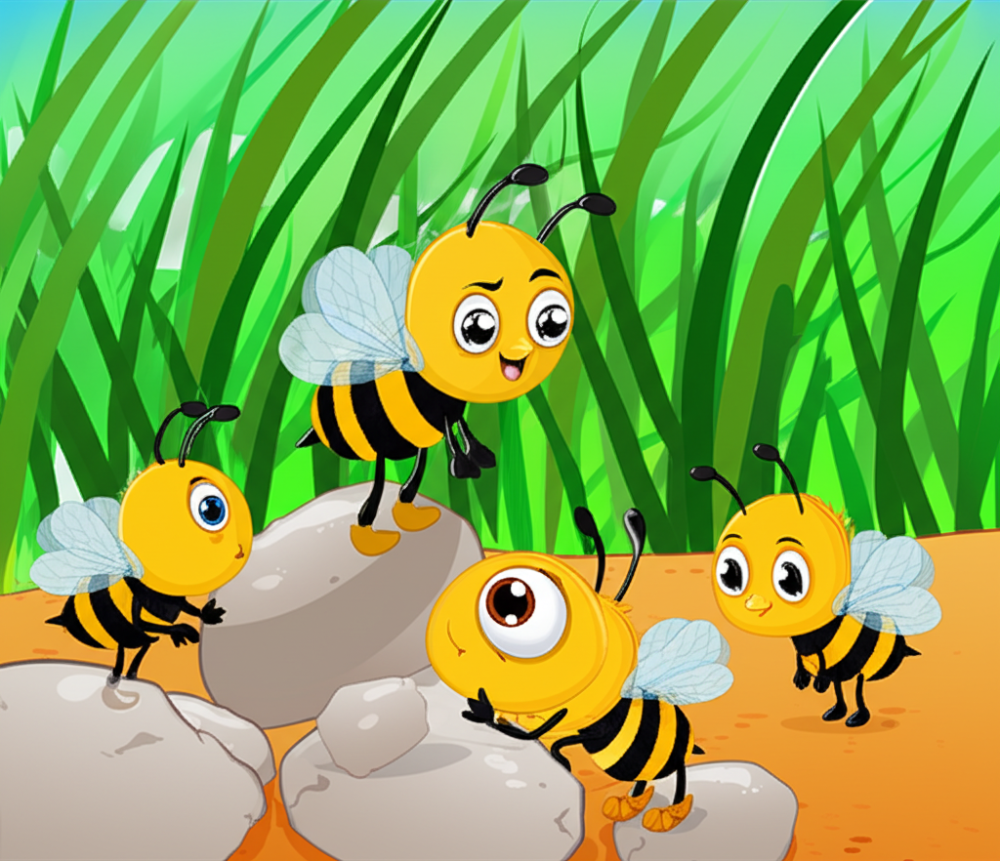
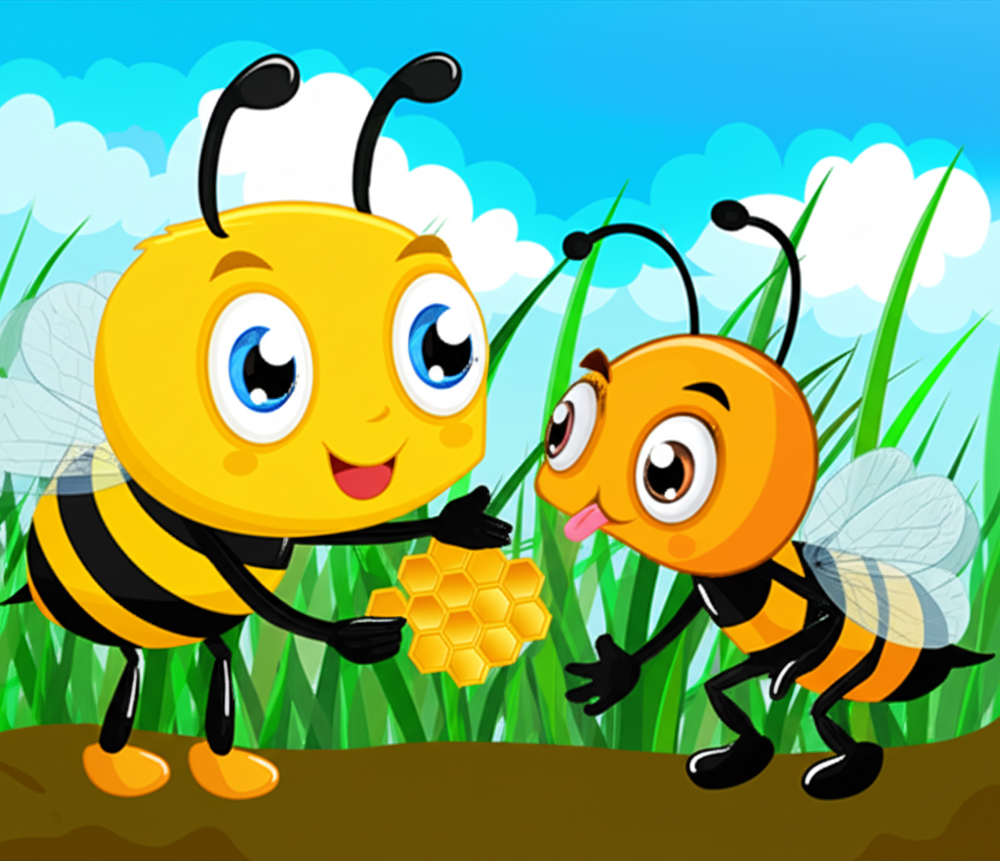

In [5]:
from PIL import Image
from io import BytesIO
from IPython.core.display import display, HTML
import base64
import markdown2  # Библиотека для конвертации Markdown в HTML

html_parts = []
n = 1

for part in response.candidates[0].content.parts:
    if part.text is not None:
        html_text = markdown2.markdown(part.text)  # Конвертация Markdown → HTML
        html_parts.append(html_text)
    elif part.inline_data is not None:
        image = Image.open(BytesIO(part.inline_data.data))

        # Сохранение файла
        filename = f"image_{n}.png"
        image.save(filename)

        # Конвертация в base64 для HTML
        buffer = BytesIO()
        image.save(buffer, format="PNG")
        img_base64 = base64.b64encode(buffer.getvalue()).decode()

        # Добавляем в HTML
        html_parts.append(f'<img src="data:image/png;base64,{img_base64}" width="300">')

    n += 1

html_content = "<div style='font-family: Arial, sans-serif;'>" + "".join(html_parts) + "</div>"

display(HTML(html_content))


А теперь сохраним сформированный документ в виде pdf-файла.

In [6]:
from weasyprint import HTML

pdf_filename = "output.pdf"

# Добавляем CSS для правильного размещения изображений
css = """
    body { font-family: Arial, sans-serif; font-size: 14px; }
    img { display: block; margin: 10px auto; max-width: 90%; }
    p { text-align: justify; }
    h1, h2, h3 { text-align: center; }
"""

# Оборачиваем HTML-контент в <style>
full_html = f"<html><head><style>{css}</style></head><body>{html_content}</body></html>"

# Генерируем PDF с CSS
HTML(string=full_html).write_pdf(pdf_filename)


DEBUG:fontTools.ttLib.ttFont:Reading 'maxp' table from disk
DEBUG:fontTools.ttLib.ttFont:Decompiling 'maxp' table
DEBUG:fontTools.subset.timer:Took 0.005s to load 'maxp'
DEBUG:fontTools.subset.timer:Took 0.000s to prune 'maxp'
INFO:fontTools.subset:maxp pruned
DEBUG:fontTools.ttLib.ttFont:Reading 'cmap' table from disk
DEBUG:fontTools.ttLib.ttFont:Decompiling 'cmap' table
DEBUG:fontTools.ttLib.ttFont:Reading 'post' table from disk
DEBUG:fontTools.ttLib.ttFont:Decompiling 'post' table
DEBUG:fontTools.subset.timer:Took 0.010s to load 'cmap'
DEBUG:fontTools.subset.timer:Took 0.000s to prune 'cmap'
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:fpgm dropped
INFO:fontTools.subset:prep dropped
INFO:fontTools.subset:cvt  dropped
INFO:fontTools.subset:kern dropped
DEBUG:fontTools.subset.timer:Took 0.000s to load 'post'
DEBUG:fontTools.subset.timer:Took 0.000s to prune 'post'
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:GPOS dropped
INFO:fontTools.subset:GSUB dropped
DEBUG:f

## Редактирование изображения через API


Исходное изображение:


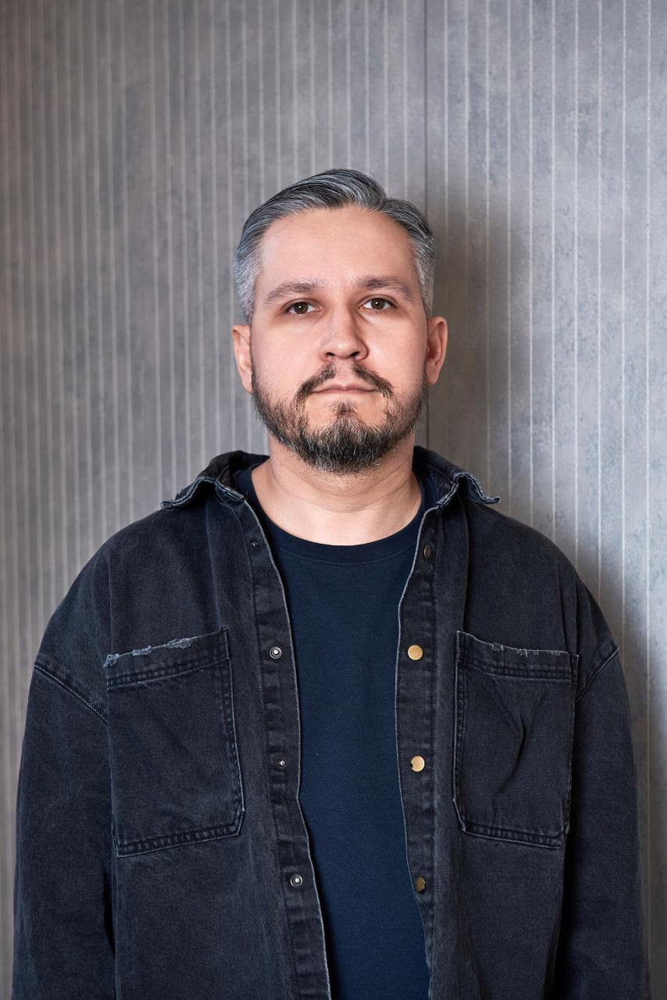

In [7]:
from google import genai
from google.genai import types
from PIL import Image
from io import BytesIO
import cv2
from google.colab.patches import cv2_imshow



# Инициализация клиента
client = genai.Client(api_key=key_g)

# Загрузка входного изображения

image = Image.open('/content/photo_2025-03-17 08.55.18.jpeg')
print('Исходное изображение:')
cv2_imshow(cv2.imread('/content/photo_2025-03-17 08.55.18.jpeg'))

response = client.models.generate_content(
    model="gemini-2.0-flash-exp",
    contents=["Переодень человека в костюм эпохи Возрождения.", image],
    config=types.GenerateContentConfig(
        response_modalities=["Text", "Image"]
    )
    )


Сохраним отредактированное изображение и выведем его на экран.

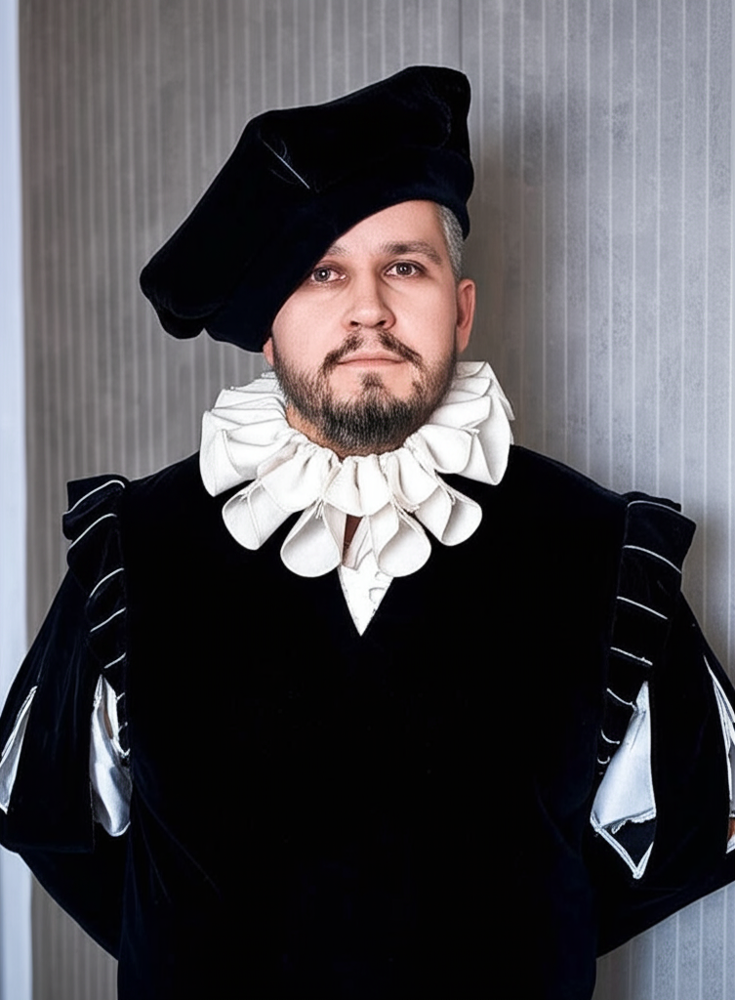

In [9]:
from PIL import Image
from io import BytesIO

n = 1
for part in response.candidates[0].content.parts:
  if part.text is not None:
    print(part.text)
  elif part.inline_data is not None:
    image = Image.open(BytesIO(part.inline_data.data))
    image.save(f'out{n}.png')
    cv2_imshow(cv2.imread(f'out{n}.png'))
  n += 1